In [5]:
from scipy.io import loadmat, whosmat
import numpy as np
import pandas as pd
import xarray as xr
import warnings
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from bluemath_tk.core.plotting.utils import join_colormaps

from bluemath_tk.core.plotting.base_plotting import DefaultStaticPlotting
plot = DefaultStaticPlotting()

KeyError: "No variable named 'wmo_pres'. Variables on the dataset include ['lon_trks', 'lat_trks', 'u250_trks', 'v250_trks', 'u850_trks', ..., 'time', 'year', 'basin', 'month', 'storm']"

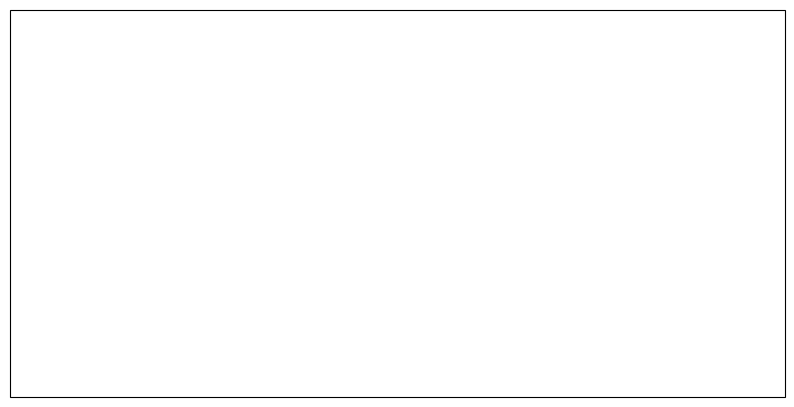

In [7]:
from bluemath_tk.core.plotting.base_plotting import DefaultStaticPlotting
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cartopy.crs as ccrs

# Définir les catégories et couleurs (échelle Saffir-Simpson)
def get_category_color(p_hPa):
    """Retourne la couleur et le nom de catégorie selon la pression."""
    if p_hPa < 920:
        return '#FF0000', 'CATS'      # Rouge vif
    elif p_hPa < 944:
        return '#FF6600', 'Cat 4'      # Orange foncé
    elif p_hPa < 964:
        return '#FFC800', 'Cat 3'      # Orange/Jaune
    elif p_hPa < 979:
        return '#FFFF00', 'Cat 2'      # Jaune
    elif p_hPa < 1000:
        return '#00FF00', 'Cat 1'      # Vert
    else:
        return '#00BFFF', 'TS'         # Bleu clair

# Couleurs pour la légende
category_colors = {
    'CATS': '#FF0000',
    'Cat 4': '#FF6600',
    'Cat 3': '#FFC800',
    'Cat 2': '#FFFF00',
    'Cat 1': '#00FF00',
    'TS': '#00BFFF',
}

plot = DefaultStaticPlotting()

fig2, ax2 = plt.subplots(figsize=(10, 10), subplot_kw={"projection": ccrs.PlateCarree()})

# Stocker les catégories présentes pour la légende
categories_present = set()

hist_tracks_nc = xr.open_dataset('/lustre/geocean/WORK/users/alonsoap/personal/MUSCLE_TCS_NC/outputs/tracks_at_7r/synth_tracks_7r_filter.nc')

for i in range(len(hist_tracks_nc.storm)):

    df_synth = hist_tracks_nc.isel(storm=i)
    # Couleur basée sur p_furthest
    pp = np.nanmin(df_synth["wmo_pres"].values)
    color, cat_name = get_category_color(pp)
    categories_present.add(cat_name)
    
    ax2.plot(df_synth['lon'].values - 360, df_synth['lat'].values, color=color, lw=0.8, alpha=0.7)

#ax2.autoscale()
ax2.set_extent([-85.59778323614441, -65.57997489252989, 23.608333396911625, 44.22499866485596])
extent = ax2.get_extent(crs=ccrs.PlateCarree())

margin = 0.5
area = [
    extent[0] - margin,
    extent[1] + margin,
    extent[2] - margin,
    extent[3] + margin,
]

plot.plot_satellite(ax=ax2, source="arcgis", area=area)

# Légende (seulement les catégories présentes, dans l'ordre)
legend_order = ['CATS', 'Cat 4', 'Cat 3', 'Cat 2', 'Cat 1', 'TS']
handles = [
    mpatches.Patch(color=category_colors[cat], label=cat)
    for cat in legend_order if cat in categories_present
]
ax2.legend(handles=handles, loc='upper right', fontsize=10, title='Category')

ax2.set_extent([-85.59778323614441, -65.57997489252989, 23.608333396911625, 44.22499866485596], crs=ccrs.PlateCarree())
plt.title("Historical Hurricane Tracks by Category", fontsize=14)
plt.savefig('figures/Syntesis/03_synthetic_hurricane_tracks_by_category.png', dpi=200)

In [8]:
def mat_to_xr_dataset(path, variables=None, time_range=None):
    """
    Convert a MATLAB file to xarray.Dataset, loading only requested data.
    
    Parameters
    ----------
    path : str
        Path to .mat file
    variables : list of str, optional
        Variable names to load (e.g., ['Hsig', 'Windv_x']). 
        If None, loads all variables.
    time_range : tuple of (start, end), optional
        Only load timesteps within this range.
        e.g., ('2000-01-01', '2000-01-02')
    
    Returns
    -------
    xr.Dataset
    """
    mat_info = whosmat(path)
    all_keys = [name for name, shape, dtype in mat_info]

    vars_with_keys = {}
    
    for key in all_keys:
        if key.startswith(("Xp", "Yp", "__")):
            continue
        parts = key.rsplit("_", 2)
        if len(parts) >= 3:
            varname = "_".join(parts[:-2])
            timestamp_str = f"{parts[-2]}_{parts[-1]}"
            try:
                timestamp = pd.to_datetime(timestamp_str, format="%Y%m%d_%H%M%S")
                vars_with_keys.setdefault(varname, []).append((key, timestamp))
            except ValueError:
                continue

    if variables is not None:
        vars_with_keys = {k: v for k, v in vars_with_keys.items() if k in variables}
    
    if not vars_with_keys:
        raise ValueError(f"No matching variables found. Available: {list(vars_with_keys.keys())}")

    if time_range is not None:
        t_start, t_end = pd.to_datetime(time_range[0]), pd.to_datetime(time_range[1])
        for varname in vars_with_keys:
            vars_with_keys[varname] = [
                (k, t) for k, t in vars_with_keys[varname] 
                if t_start <= t <= t_end
            ]

    keys_to_load = {"Xp", "Yp"}
    for varname, key_times in vars_with_keys.items():
        keys_to_load.update(k for k, t in key_times)

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="Duplicate variable name")
        mat = loadmat(path, variable_names=list(keys_to_load))
    
    lon = mat["Xp"].ravel().astype(np.float32)
    lat = mat["Yp"].ravel().astype(np.float32)

    ds_vars = {}
    time_index = None
    
    for varname, key_times in vars_with_keys.items():
        key_times.sort(key=lambda x: x[1])  # Sort by timestamp
        
        n_times = len(key_times)
        n_points = lon.size
        data_array = np.empty((n_times, n_points), dtype=np.float32)
        
        for i, (key, _) in enumerate(key_times):
            data_array[i] = mat[key].ravel()
        
        if time_index is None:
            time_index = pd.DatetimeIndex([t for _, t in key_times])
        
        ds_vars[varname] = (("time", "points"), data_array)
    
    return xr.Dataset(
        data_vars=ds_vars,
        coords={
            "time": time_index,
            "lon": ("points", lon),
            "lat": ("points", lat),
        },
    )


def list_mat_variables(path):
    """List available variables and time range in a .mat file."""
    mat_info = whosmat(path)
    
    vars_info = {}
    for name, shape, dtype in mat_info:
        if name.startswith(("Xp", "Yp", "__")):
            continue
        parts = name.rsplit("_", 2)
        if len(parts) >= 3:
            varname = "_".join(parts[:-2])
            timestamp_str = f"{parts[-2]}_{parts[-1]}"
            try:
                timestamp = pd.to_datetime(timestamp_str, format="%Y%m%d_%H%M%S")
                if varname not in vars_info:
                    vars_info[varname] = {"count": 0, "t_min": timestamp, "t_max": timestamp}
                vars_info[varname]["count"] += 1
                vars_info[varname]["t_min"] = min(vars_info[varname]["t_min"], timestamp)
                vars_info[varname]["t_max"] = max(vars_info[varname]["t_max"], timestamp)
            except ValueError:
                continue
    
    return vars_info

In [9]:
def read_adcirc_grd(grd_file: str):

    with open(grd_file, "r") as f:
        _header0 = f.readline()
        header1 = f.readline()
        header_nums = list(map(float, header1.split()))
        nelmts = int(header_nums[0])
        nnodes = int(header_nums[1])

        Nodes = np.loadtxt(f, max_rows=nnodes)
        Elmts = np.loadtxt(f, max_rows=nelmts) - 1
        lines = f.readlines()

    return Nodes, Elmts, lines

Nodes_calc, Elmts_calc, lines_calc = read_adcirc_grd("templates/fort.14")

triangles = Elmts_calc[:, 2:5].astype(int)

Using Esri World Imagery (ArcGIS):
- Free for public and non-commercial use
- Commercial use allowed under Esri terms of service
- Attribution required: 'Tiles © Esri — Sources: Esri, Earthstar Geographics, CNES/Airbus DS, USDA, USGS, AeroGRID, IGN, and the GIS User Community'
- Max zoom ~19
Processing case 0/64: 5464
Processing case 10/64: 5196
Processing case 20/64: 9045
Processing case 30/64: 4305
Processing case 40/64: 3981
Processing case 50/64: 9802
Processing case 60/64: 8794


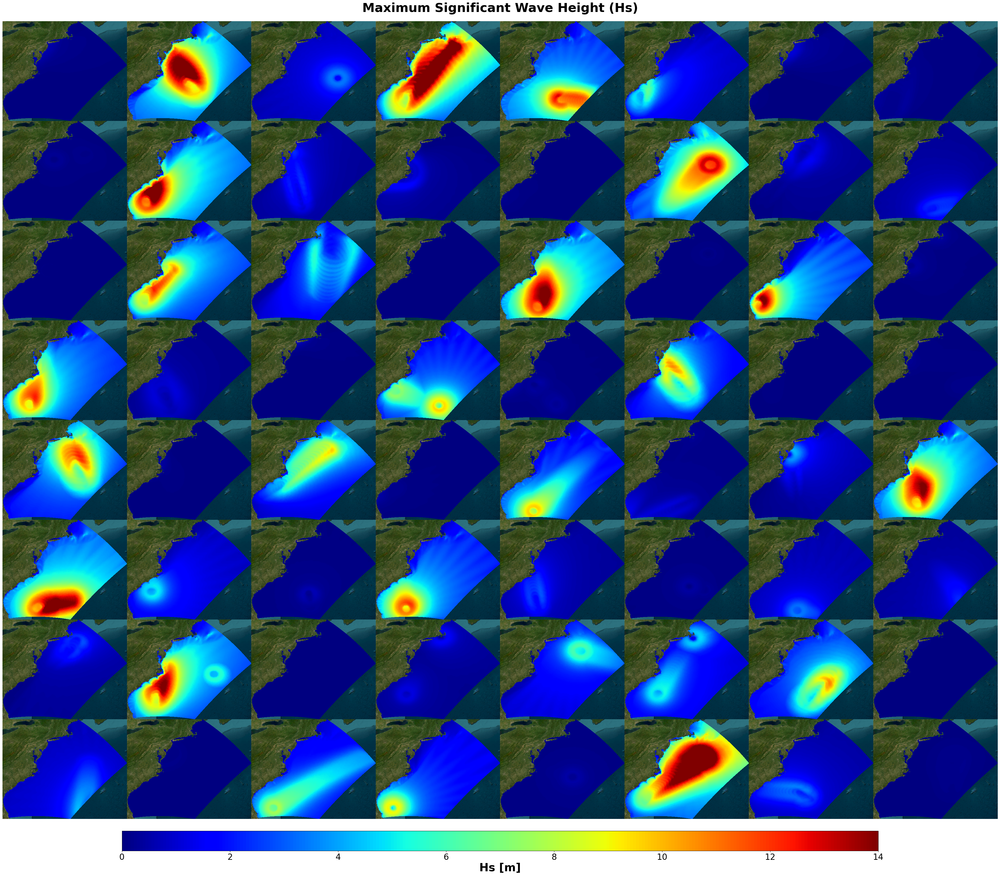

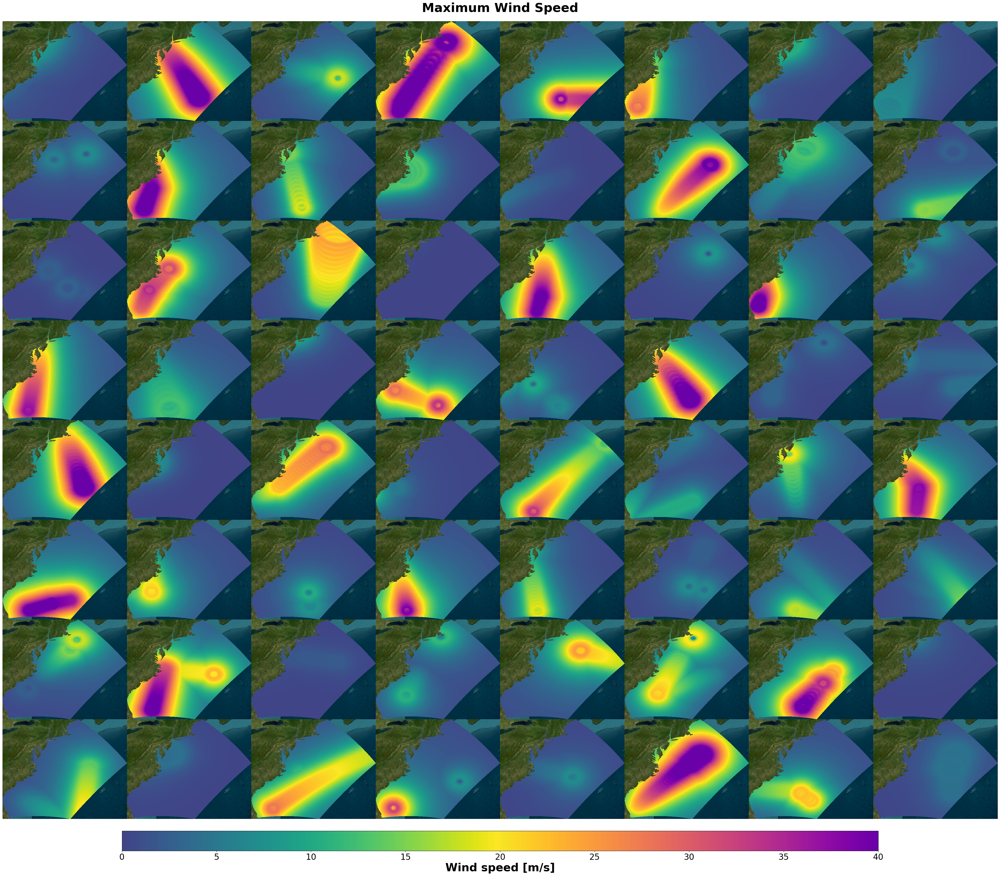

In [10]:
ncols, nrows = 8, 8

df = pd.read_csv("outputs/selected_cases_MDA.csv", header=None)
selected_cases = df.iloc[:, 0].tolist()[:ncols * nrows]

cmap = join_colormaps(
    cmap1="viridis",
    cmap2="plasma_r",
    name="wind_partition_cmap",
    range1=(0.2, 1.0),
    range2=(0.05, 0.8),
)

plot = DefaultStaticPlotting()

area = [
    Nodes_calc[:, 1].min(),
    Nodes_calc[:, 1].max(),
    Nodes_calc[:, 2].min(),
    Nodes_calc[:, 2].max(),
]

lon_range = area[1] - area[0]
lat_range = area[3] - area[2]
aspect_ratio = lon_range / lat_range

panel_height = 4
panel_width = panel_height * aspect_ratio

# Espace fixe en pouces (indépendant du nombre de panneaux)
title_height = 1.5   # pouces pour le titre
cbar_height = 1.6    # pouces pour la colorbar (plus grand)

fig_width = panel_width * ncols
fig_height = panel_height * nrows + title_height + cbar_height

fig_temp, ax_temp = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
ax_temp.set_extent(area, crs=ccrs.PlateCarree())
plot.plot_satellite(ax=ax_temp, source="arcgis", area=area)

satellite_img = None
satellite_extent = None
for child in ax_temp.get_children():
    if hasattr(child, 'get_array') and hasattr(child, 'get_extent'):
        arr = child.get_array()
        if arr is not None and arr.size > 100:
            satellite_img = arr
            satellite_extent = child.get_extent()
            break
plt.close(fig_temp)

fig1, axes_1 = plt.subplots(
    ncols=ncols,
    nrows=nrows,
    subplot_kw={"projection": ccrs.PlateCarree()},
    figsize=(fig_width, fig_height),
)
axes_1 = axes_1.flatten()

fig2, axes_2 = plt.subplots(
    ncols=ncols,
    nrows=nrows,
    subplot_kw={"projection": ccrs.PlateCarree()},
    figsize=(fig_width, fig_height),
)
axes_2 = axes_2.flatten()

Hsmin, Hsmax = 0, 14
Wmin, Wmax = 0, 40

max_Hs = []
max_W = []

for ax in list(axes_1) + list(axes_2):
    ax.set_extent(area, crs=ccrs.PlateCarree())
    if satellite_img is not None:
        ax.imshow(
            satellite_img,
            extent=satellite_extent,
            transform=ccrs.PlateCarree(),
            origin='lower',
            zorder=0,
        )
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    for spine in ax.spines.values():
        spine.set_visible(False)

for i, case in enumerate(selected_cases):
    if i % 10 == 0:
        print(f"Processing case {i}/{len(selected_cases)}: {case}")
    
    swan_output = f"cases/metamodel/{case}/output.mat"
    ds = mat_to_xr_dataset(swan_output, variables=["Hsig", "Windv_x", "Windv_y"])

    facecolor_Hs = np.mean(ds.Hsig.max(dim="time").values[triangles], axis=1)
    max_Hs.append(ds.Hsig.max().item())
    pcm1 = axes_1[i].tripcolor(
        Nodes_calc[:, 1],
        Nodes_calc[:, 2],
        triangles,
        facecolor_Hs,
        shading="flat",
        cmap="jet",
        vmin=Hsmin,
        vmax=Hsmax,
        zorder=1,
    )

    W = np.sqrt(ds.Windv_x**2 + ds.Windv_y**2)
    facecolor_W = np.mean(W.max(dim="time").values[triangles], axis=1)
    max_W.append(W.max().item())
    pcm2 = axes_2[i].tripcolor(
        Nodes_calc[:, 1],
        Nodes_calc[:, 2],
        triangles,
        facecolor_W,
        shading="flat",
        cmap=cmap,
        vmin=Wmin,
        vmax=Wmax,
        zorder=1,
    )

# Ratios en proportion de la figure
title_ratio = title_height / fig_height
cbar_ratio = cbar_height / fig_height

for fig, pcm, label, title in [
    (fig1, pcm1, "Hs [m]", "Maximum Significant Wave Height (Hs)"),
    (fig2, pcm2, "Wind speed [m/s]", "Maximum Wind Speed"),
]:
    fig.subplots_adjust(
        left=0, right=1, 
        top=1 - title_ratio,
        bottom=cbar_ratio,
        wspace=0, hspace=0
    )
    
    # Titre (encore plus gros)
    fig.suptitle(
        title, 
        fontsize=36,
        fontweight='bold', 
        y=1 - title_ratio / 2
    )
    
    # Colorbar plus lisible
    cbar_ax = fig.add_axes([0.12, cbar_ratio * 0.2, 0.76, cbar_ratio * 0.5])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation="horizontal")
    cbar.set_label(label, fontsize=32, fontweight='bold')
    cbar.ax.tick_params(labelsize=24)

fig1.savefig("figures/Syntesis/06_all_cases_Hs.png", dpi=150)
fig2.savefig("figures/Syntesis/06_all_cases_Wind.png", dpi=150)

In [ ]:
fig1.savefig("all_cases_Hs.png", dpi=150, pad_inches=0.1)
fig2.savefig("all_cases_Wind.png", dpi=150, pad_inches=0.1)